In [ ]:
# === Crear estructura 3DPW en /content ===
# Uso: solo prepara la estructura de carpetas que espera 3DPW; las siguientes celdas usarán el .pkl de sequenceFiles.

import os, pathlib

BASE = "/content/3DPW"
SEQ_NAMES = ["TU_SECUENCIA"]  # <- cámbialo; puedes poner varias: ["seq1", "seq2"]

# carpetas base
os.makedirs(f"{BASE}/sequenceFiles", exist_ok=True)
os.makedirs(f"{BASE}/imageFiles", exist_ok=True)

# carpetas por secuencia para las IMÁGENES originales (no se usan en GT_common, solo como referencia)
for seq in SEQ_NAMES:
    os.makedirs(f"{BASE}/imageFiles/{seq}", exist_ok=True)
    # archivo vacío para que la carpeta se vea aunque esté vacía
    pathlib.Path(f"{BASE}/imageFiles/{seq}/.keep").touch()

# mostrar estructura sencilla
def print_tree(root):
    root = pathlib.Path(root)
    for p in sorted(root.rglob("*")):
        rel = p.relative_to(root)
        indent = "  " * (len(rel.parts)-1)
        print(f"{indent}{p.name}{'/' if p.is_dir() else ''}")

print(f"Estructura creada en: {BASE}\n")
print_tree(BASE)

print("\nSigue estos pasos:")
print("1) Sube el .pkl a /content/3DPW/sequenceFiles/")
print("2) Sube las imágenes (image_00000.jpg/png, etc.) a /content/3DPW/imageFiles/TU_SECUENCIA/")


Estructura creada en: /content/3DPW

imageFiles/
  TU_SECUENCIA/
    .keep
sequenceFiles/

Sigue estos pasos:
1) Sube el .pkl a /content/3DPW/sequenceFiles/
2) Sube las imágenes (image_00000.jpg/png, etc.) a /content/3DPW/imageFiles/TU_SECUENCIA/


In [ ]:
# Dependencias mínimas para trabajar con 3DPW en Colab (lectura .pkl, arrays y gráficos)
!pip install -q chumpy opencv-python numpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.6/50.6 kB 3.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [ ]:
# (Opcional) Ejecutar la demo oficial de 3DPW si se tiene el script disponible:

#!python /content/demo_py3_colab.py --seq_name "TU_SECUENCIA" --frame 25 --actor 0


[OK] Guardado: /content/skeleton_3dpw.png


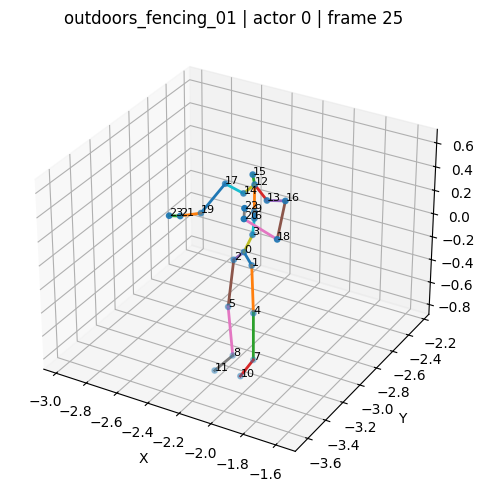

In [ ]:
# === Esqueleto 3D desde 3DPW (sin SMPL, sin imágenes) ===
# Uso: inspeccionar visualmente el esqueleto de 3DPW antes de generar GT_common (no genera archivos que use el pipeline principal).

# Requisitos: un solo archivo: /content/3DPW/sequenceFiles/<TU_SECUENCIA>.pkl
# Si no tienes la carpeta, créala y sube el .pkl.

import pickle as pkl, numpy as np, matplotlib.pyplot as plt
from pathlib import Path

# ---- Config ----
DATASET_DIR = "/content/3DPW"
SEQ_NAME    = "outdoors_fencing_01"  # <- sin .pkl
I_MODEL     = 0               # actor (0 o 1)
I_FRAME     = 25              # frame a visualizar
OUT_PATH    = "/content/skeleton_3dpw.png"

# Conexiones del esqueleto SMPL-24 (pares de índices)
EDGES = [
    (0,1),(1,4),(4,7),(7,10),          # pierna izquierda
    (0,2),(2,5),(5,8),(8,11),          # pierna derecha
    (0,3),(3,6),(6,9),(9,12),(12,15),  # columna y cabeza
    (12,13),(13,16),(16,18),(18,20),(20,22),  # brazo izquierdo
    (12,14),(14,17),(17,19),(19,21),(21,23)   # brazo derecho
]

# --- Carga del .pkl ---
pkl_path = Path(DATASET_DIR) / "sequenceFiles" / f"{SEQ_NAME}.pkl"
with open(pkl_path, "rb") as f:
    seq = pkl.load(f, encoding="latin1")

JP = np.asarray(seq["jointPositions"][I_MODEL])  # (N, 72) o (N, 24, 3)
if JP.ndim == 2 and JP.shape[1] == 24*3:
    JP = JP.reshape(-1, 24, 3)
elif JP.ndim != 3 or JP.shape[1] != 24 or JP.shape[2] != 3:
    raise ValueError(f"Forma inesperada de jointPositions: {JP.shape}")

if not (0 <= I_FRAME < JP.shape[0]):
    raise IndexError(f"I_FRAME fuera de rango (0..{JP.shape[0]-1})")

J = JP[I_FRAME]  # (24, 3)

# Ajuste de ejes para alinear el sistema de coordenadas con el usado en el resto de notebooks (x, -z, y)
# Rotación solicitada: (x, y, z) -> (x, -z, y)
J = J[:, [0, 2, 1]]   # reordena columnas: x, z, y
J[:, 1] *= -1         # newY = -oldZ


# --- Plot 3D ---
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(111, projection='3d')

# puntos
ax.scatter(J[:,0], J[:,1], J[:,2], s=15)
# Numerar articulaciones según el orden del .pkl (SMPL-24: índices 0..23)
for idx, (x, y, z) in enumerate(J):
    ax.text(x, y, z, f"{idx}", fontsize=8)  # si se superpone, sube fontsize o mueve el frame


# aristas
for a,b in EDGES:
    ax.plot([J[a,0], J[b,0]], [J[a,1], J[b,1]], [J[a,2], J[b,2]], linewidth=2)

# igualar escala en x,y,z
max_range = (J.max(axis=0) - J.min(axis=0)).max()
mid = J.mean(axis=0)
for i,(m) in enumerate(mid):
    lo, hi = m - max_range/2, m + max_range/2
    if i==0: ax.set_xlim(lo, hi)
    if i==1: ax.set_ylim(lo, hi)
    if i==2: ax.set_zlim(lo, hi)

ax.set_title(f"{SEQ_NAME} | actor {I_MODEL} | frame {I_FRAME}")
ax.set_xlabel("X"); ax.set_ylabel("Y"); ax.set_zlabel("Z")
plt.tight_layout()
plt.savefig(OUT_PATH, dpi=200)
print(f"[OK] Guardado: {OUT_PATH}")
plt.show()


In [ ]:
# === TODOS los frames del esqueleto 3DPW + MP4 (una sola celda) ===
# Uso: solo para visualización/diagnóstico del esqueleto SMPL-24; NO se usa directamente en el cálculo de métricas.

# Requisito: /content/3DPW/sequenceFiles/<SEQ>.pkl
# Salidas:
#   - PNGs: /content/skeleton_frames/<seq>_actor<I_MODEL>_frameXXXXX.png
#   - Video: /content/skeleton_frames/<seq>_actor<I_MODEL>.mp4 (30 fps)

import pickle as pkl, numpy as np, matplotlib.pyplot as plt, cv2, os, glob
from pathlib import Path
from IPython.display import Video, display

# ---- Config ----
DATASET_DIR = "/content/3DPW"
SEQ_NAME    = "outdoors_fencing_01"  # <- sin .pkl
I_MODEL     = 0                      # 0 o 1
OUT_DIR     = Path("/content/skeleton_frames")
FPS         = 30
DPI         = 150
FIGSIZE     = (5,5)  # pulgadas

# Conexiones SMPL-24 (pares de índices de articulaciones en jointPositions)
EDGES = [
    (0,1),(1,4),(4,7),(7,10),          # pierna izq
    (0,2),(2,5),(5,8),(8,11),          # pierna der
    (0,3),(3,6),(6,9),(9,12),(12,15),  # columna y cabeza
    (12,13),(13,16),(16,18),(18,20),(20,22),  # brazo izq
    (12,14),(14,17),(17,19),(19,21),(21,23)   # brazo der
]

OUT_DIR.mkdir(parents=True, exist_ok=True)

# --- Cargar secuencia ---
pkl_path = Path(DATASET_DIR) / "sequenceFiles" / f"{SEQ_NAME}.pkl"
with open(pkl_path, "rb") as f:
    seq = pkl.load(f, encoding="latin1")

JP = np.asarray(seq["jointPositions"][I_MODEL])  # (N,72) o (N,24,3)
if JP.ndim == 2 and JP.shape[1] == 24*3:
    JP = JP.reshape(-1, 24, 3)
elif JP.ndim != 3 or JP.shape[1:] != (24,3):
    raise ValueError(f"Forma inesperada de jointPositions: {JP.shape}")

# --- Rotación global: (x,y,z) -> (x,-z,y) ---
J_all = JP[:, :, [0,2,1]].copy()
J_all[:, :, 1] *= -1

T = J_all.shape[0]

# --- Límites fijos (misma escala en todos los frames) ---
mins = J_all.reshape(T*24,3).min(axis=0)
maxs = J_all.reshape(T*24,3).max(axis=0)
max_range = (maxs - mins).max()
mid = (maxs + mins) / 2.0
lims = np.stack([mid - max_range/2, mid + max_range/2], axis=0)  # [[xlo,ylo,zlo],[xhi,yhi,zhi]]

# --- Render de TODOS los frames a PNG ---
paths = []
for t in range(T):
    J = J_all[t]  # (24,3)

    fig = plt.figure(figsize=FIGSIZE)
    ax = fig.add_subplot(111, projection='3d')

    # puntos + números
    ax.scatter(J[:,0], J[:,1], J[:,2], s=15)
    off = 0.02 * max_range
    for idx, (x,y,z) in enumerate(J):
        ax.text(x+off, y+off, z+off, f"{idx}", fontsize=8)

    # aristas
    for a,b in EDGES:
        ax.plot([J[a,0], J[b,0]], [J[a,1], J[b,1]], [J[a,2], J[b,2]], linewidth=2)

    # límites fijos
    ax.set_xlim(lims[0,0], lims[1,0])
    ax.set_ylim(lims[0,1], lims[1,1])
    ax.set_zlim(lims[0,2], lims[1,2])

    ax.set_title(f"{SEQ_NAME} | actor {I_MODEL} | frame {t}")
    ax.set_xlabel("X"); ax.set_ylabel("Y"); ax.set_zlabel("Z")
    plt.tight_layout()

    out_png = OUT_DIR / f"{SEQ_NAME}_actor{I_MODEL}_frame{t:05d}.png"
    plt.savefig(out_png, dpi=DPI)
    plt.close(fig)
    paths.append(str(out_png))

print(f"[OK] {len(paths)} PNGs en {OUT_DIR}")

# --- MP4 a partir de los PNGs ---
# Nota: resolución fija por figura (FIGSIZE x DPI)
first_img = cv2.imread(paths[0])
h, w = first_img.shape[:2]
video_path = str(OUT_DIR / f"{SEQ_NAME}_actor{I_MODEL}.mp4")
fourcc = cv2.VideoWriter_fourcc(*"mp4v")
writer = cv2.VideoWriter(video_path, fourcc, FPS, (w, h))

for p in paths:
    frame = cv2.imread(p)
    if frame is None or frame.shape[:2] != (h, w):
        raise RuntimeError(f"Dimensión inesperada en {p}")
    writer.write(frame)
writer.release()

print(f"[OK] Video: {video_path}")

# --- Mostrar el video inline ---
display(Video(video_path, embed=True))


[OK] 942 PNGs en /content/skeleton_frames
[OK] Video: /content/skeleton_frames/outdoors_fencing_01_actor0.mp4


***Solo usar si se va a procesar una sola secuencia (.pkl) del dataset 3DPW***

[OK] Guardado NPY: /content/outdoors_fencing_01.npy  |  forma: (942, 14, 3), dtype: float32
[OK] Preview guardado: /content/GT_common_preview.png


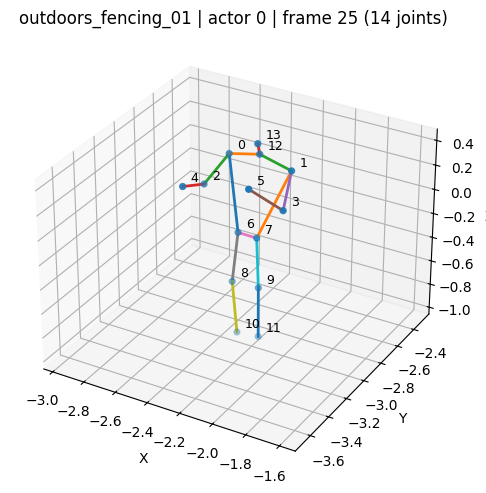

In [ ]:
# === Generar GT_common_joints_3d.npy (T,14,3) + preview ===
# Requisito: /content/3DPW/sequenceFiles/<SEQ>.pkl
# Salidas:
#   - /content/GT_common_joints_3d.npy  (T,14,3) float32
#   - /content/GT_common_preview.png    (plot del esqueleto simplificado)

import pickle as pkl, numpy as np, matplotlib.pyplot as plt
from pathlib import Path

# ---- Config ----
DATASET_DIR = "/content/3DPW"
SEQ_NAME    = "outdoors_fencing_01"   # <- sin .pkl
I_MODEL     = 0                       # 0 o 1
OUT_NPY     = f"/content/{SEQ_NAME}.npy"
OUT_PREVIEW = "/content/GT_common_preview.png"
FRAME_PREVIEW = 25                    # se ajusta si está fuera de rango

# Selección de las 14 articulaciones comunes (índices SMPL-24) que se usarán en TODA la tesis para comparar GT vs modelos.
# Índices GT (SMPL-24) -> nuevo orden 0..13
IDX_GT_TO14 = [17, 16, 19, 18, 21, 20, 2, 1, 5, 4, 8, 7, 12, 15]

# Conexiones del esqueleto nuevo (índices 0..13)
EDGES_14 = [
    (0,6),(1,7),(0,2),(2,4),(1,3),(3,5),
    (6,7),(6,8),(8,10),(7,9),(9,11),
    (12,0),(12,1),(12,13)
]

# --- Cargar jointPositions ---
pkl_path = Path(DATASET_DIR) / "sequenceFiles" / f"{SEQ_NAME}.pkl"
with open(pkl_path, "rb") as f:
    seq = pkl.load(f, encoding="latin1")

JP = np.asarray(seq["jointPositions"][I_MODEL])  # (T,72) o (T,24,3)
if JP.ndim == 2 and JP.shape[1] == 24*3:
    JP = JP.reshape(-1, 24, 3)
elif JP.ndim != 3 or JP.shape[1:] != (24,3):
    raise ValueError(f"Forma inesperada de jointPositions: {JP.shape}")

T = JP.shape[0]

# --- Rotación: (x,y,z) -> (x,-z,y) ---
J_all = JP[:, :, [0, 2, 1]].copy()
J_all[:, :, 1] *= -1

# --- Extraer 14 articulaciones en el orden solicitado ---
J14 = J_all[:, IDX_GT_TO14, :].astype(np.float32)  # (T,14,3)

# Este .npy será el ground truth (GT_common) que leerán los notebooks de modelos y postprocesamiento.
# --- Guardar NPY ---
np.save(OUT_NPY, J14)
print(f"[OK] Guardado NPY: {OUT_NPY}  |  forma: {J14.shape}, dtype: {J14.dtype}")

# --- Preview (elige frame válido) ---
t = FRAME_PREVIEW if 0 <= FRAME_PREVIEW < T else min(25, T-1)
P = J14[t]  # (14,3)

# Plot con escala uniforme
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(P[:,0], P[:,1], P[:,2], s=18)
# numerar 0..13 con pequeño offset
max_range = (P.max(axis=0) - P.min(axis=0)).max()
off = 0.02 * max_range
for idx, (x,y,z) in enumerate(P):
    ax.text(x+off, y+off, z+off, f"{idx}", fontsize=9)

# aristas
for a,b in EDGES_14:
    ax.plot([P[a,0],P[b,0]], [P[a,1],P[b,1]], [P[a,2],P[b,2]], linewidth=2)

# límites iguales
mins, maxs = P.min(axis=0), P.max(axis=0)
mid = (mins + maxs)/2.0
lo, hi = mid - max_range/2, mid + max_range/2
ax.set_xlim(lo[0], hi[0]); ax.set_ylim(lo[1], hi[1]); ax.set_zlim(lo[2], hi[2])

ax.set_title(f"{SEQ_NAME} | actor {I_MODEL} | frame {t} (14 joints)")
ax.set_xlabel("X"); ax.set_ylabel("Y"); ax.set_zlabel("Z")
plt.tight_layout()
plt.savefig(OUT_PREVIEW, dpi=180)
print(f"[OK] Preview guardado: {OUT_PREVIEW}")
plt.show()


***Solo usar si se van a procesar varias secuencias (.pkl) del dataset 3DPW en lote***


In [ ]:
# === Batch 3DPW → GT_common_joints_3d (14 joints) ===
# Uso: generar en lote los archivos GT_common (<SEQ_NAME>.npy, shape (T,14,3)) que usarán los notebooks de modelos (VIBE/MediaPipe) y de postprocesamiento/métricas.

# - Lee varias secuencias desde /content/3DPW/sequenceFiles/*.pkl
# - Aplica rotación (x,y,z)->(x,-z,y)
# - Extrae joints [17,16,19,18,21,20,2,1,5,4,8,7,12,15] → orden 0..13
# - Guarda /content/<SEQ_NAME>.npy con shape (T,14,3) float32
# - (Opcional) Preview por secuencia en /content/GT_common_previews/<SEQ_NAME>.png

import pickle as pkl, numpy as np, matplotlib.pyplot as plt
from pathlib import Path

# ---- Config ----
DATASET_DIR = "/content/3DPW"
I_MODEL = 0                                # 0 o 1
SEQ_NAMES = None                           # None = auto (todos los .pkl). O lista: ["seqA","seqB",...]
MAKE_PREVIEW = True                        # False si no quieres la imagen
FRAME_PREVIEW = 25                         # frame para el preview (si existe)
# Carpeta destino para los .npy
NPY_DIR = Path("/content/GT_common_npys")
NPY_DIR.mkdir(parents=True, exist_ok=True)

# Índices GT (SMPL-24) → nuevo orden 0..13
IDX_GT_TO14 = [17, 16, 19, 18, 21, 20,  2,  1,  5,  4,  8,  7, 12, 15]

# Conexiones del esqueleto nuevo (índices 0..13)
EDGES_14 = [
    (0,6),(1,7),(0,2),(2,4),(1,3),(3,5),
    (6,7),(6,8),(8,10),(7,9),(9,11),
    (12,0),(12,1),(12,13)
]

seq_dir = Path(DATASET_DIR) / "sequenceFiles"
assert seq_dir.exists(), f"No existe: {seq_dir}"

# Resolver lista de secuencias
if SEQ_NAMES is None:
    SEQ_NAMES = sorted([p.stem for p in seq_dir.glob("*.pkl")])
    assert SEQ_NAMES, f"No encontré .pkl en {seq_dir}"

preview_dir = Path("/content/GT_common_previews")
if MAKE_PREVIEW:
    preview_dir.mkdir(parents=True, exist_ok=True)

def process_one(seq_name: str):
    pkl_path = seq_dir / f"{seq_name}.pkl"
    if not pkl_path.exists():
        print(f"[OMITIDO] No existe {pkl_path}")
        return

    # Cargar jointPositions del actor I_MODEL
    with open(pkl_path, "rb") as f:
        seq = pkl.load(f, encoding="latin1")

    JP = np.asarray(seq["jointPositions"][I_MODEL])  # (T,72) o (T,24,3)
    if JP.ndim == 2 and JP.shape[1] == 24*3:
        JP = JP.reshape(-1, 24, 3)
    elif JP.ndim != 3 or JP.shape[1:] != (24,3):
        print(f"[ERROR] {seq_name}: forma inesperada {JP.shape}")
        return

    # Rotación global: (x,y,z) -> (x,-z,y)
    J_all = JP[:, :, [0,2,1]].copy()
    J_all[:, :, 1] *= -1

    # Extraer 14 articulaciones en el orden solicitado
    J14 = J_all[:, IDX_GT_TO14, :].astype(np.float32)  # (T,14,3)

    # Guardar NPY con el nombre de la secuencia
    out_npy = NPY_DIR / f"{seq_name}.npy"
    np.save(out_npy, J14)
    print(f"[OK] {seq_name}: guardado {out_npy}  |  shape={J14.shape}")

    # Preview opcional (1 frame)
    if MAKE_PREVIEW and J14.shape[0] > 0:
        t = FRAME_PREVIEW if 0 <= FRAME_PREVIEW < J14.shape[0] else 0
        P = J14[t]  # (14,3)

        fig = plt.figure(figsize=(5,5))
        ax = fig.add_subplot(111, projection='3d')

        ax.scatter(P[:,0], P[:,1], P[:,2], s=18)
        max_range = (P.max(axis=0) - P.min(axis=0)).max()
        off = 0.02 * max_range
        for idx, (x,y,z) in enumerate(P):
            ax.text(x+off, y+off, z+off, f"{idx}", fontsize=9)

        for a,b in EDGES_14:
            ax.plot([P[a,0],P[b,0]], [P[a,1],P[b,1]], [P[a,2],P[b,2]], linewidth=2)

        # límites iguales
        mins, maxs = P.min(axis=0), P.max(axis=0)
        mid = (mins + maxs) / 2.0
        lo, hi = mid - max_range/2, mid + max_range/2
        ax.set_xlim(lo[0], hi[0]); ax.set_ylim(lo[1], hi[1]); ax.set_zlim(lo[2], hi[2])

        ax.set_title(f"{seq_name} | actor {I_MODEL} | frame {t} (14 joints)")
        ax.set_xlabel("X"); ax.set_ylabel("Y"); ax.set_zlabel("Z")
        plt.tight_layout()
        out_png = preview_dir / f"{seq_name}.png"
        plt.savefig(out_png, dpi=180)
        plt.close(fig)
        print(f"[OK] {seq_name}: preview → {out_png}")

# Ejecutar en lote
for name in SEQ_NAMES:
    try:
        process_one(name)
    except Exception as e:
        print(f"[FALLO] {name}: {e}")

# Empaquetar todos los GT_common (.npy) en un solo .zip para descargarlos y usarlos en los demás notebooks del proyecto.
# Comprimir y descargar todos los .npy generados
ZIP_PATH = "/content/GT_common_npys.zip"
!zip -q -j "$ZIP_PATH" "$NPY_DIR"/*.npy
from google.colab import files
files.download(ZIP_PATH)


[OK] courtyard_backpack_00: guardado /content/GT_common_npys/courtyard_backpack_00.npy  |  shape=(1262, 14, 3)
[OK] courtyard_backpack_00: preview → /content/GT_common_previews/courtyard_backpack_00.png
[OK] courtyard_bodyScannerMotions_00: guardado /content/GT_common_npys/courtyard_bodyScannerMotions_00.npy  |  shape=(1257, 14, 3)
[OK] courtyard_bodyScannerMotions_00: preview → /content/GT_common_previews/courtyard_bodyScannerMotions_00.png
[OK] courtyard_box_00: guardado /content/GT_common_npys/courtyard_box_00.npy  |  shape=(1041, 14, 3)
[OK] courtyard_box_00: preview → /content/GT_common_previews/courtyard_box_00.png
[OK] courtyard_jumpBench_01: guardado /content/GT_common_npys/courtyard_jumpBench_01.npy  |  shape=(619, 14, 3)
[OK] courtyard_jumpBench_01: preview → /content/GT_common_previews/courtyard_jumpBench_01.png
[OK] courtyard_laceShoe_00: guardado /content/GT_common_npys/courtyard_laceShoe_00.npy  |  shape=(931, 14, 3)
[OK] courtyard_laceShoe_00: preview → /content/GT_commo

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>